In [1]:
from pathlib import Path
import pickle
import numpy as np
import matplotlib.pyplot as plt

from plot_utils import plot_dbg_step, inspect_debug_trace_xy, decode_obs, plot_seeker_trajectory


In [2]:
BIG_PKL_PATH = Path(r"C:\Users\timok\Desktop\rl_challenge\rl-comptetition\eval_results\ckpt_3D_exploration_AC_stepwise_base_ckpt_step_000100000.pkl")  # <-- paste here (keep r"")
SEED = 1042                                                # <-- paste here
NUM_OBSTACLES = 10                                         # <-- set correctly

assert BIG_PKL_PATH.exists(), f"Pickle not found: {BIG_PKL_PATH}"
print("Using:", BIG_PKL_PATH)
print("Seed:", SEED)


Using: C:\Users\timok\Desktop\rl_challenge\rl-comptetition\eval_results\ckpt_3D_exploration_AC_stepwise_base_ckpt_step_000100000.pkl
Seed: 1042


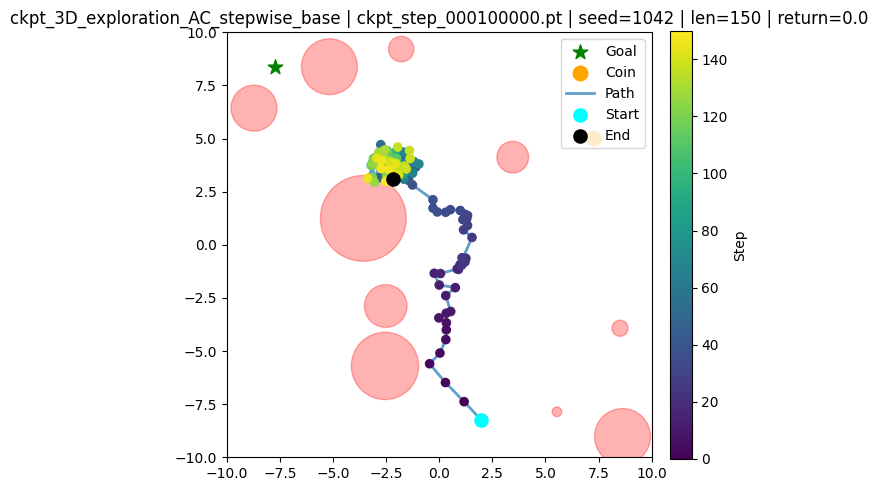

In [3]:
with open(BIG_PKL_PATH, "rb") as f:
    data = pickle.load(f)

traces = data["traces"]

# seed keys might be int or str; handle both
if SEED in traces:
    tr = traces[SEED]
elif str(SEED) in traces:
    tr = traces[str(SEED)]
else:
    raise KeyError(f"Seed {SEED} not found. Example keys: {list(traces.keys())[:10]}")

states = tr["states"]
rewards = tr["rewards"]

title = f"{data.get('run','?')} | {data.get('checkpoint','?')} | seed={SEED} | len={len(rewards)} | return={sum(rewards):.1f}"
plot_seeker_trajectory(states, num_obstacles=NUM_OBSTACLES, title=title, L=10)


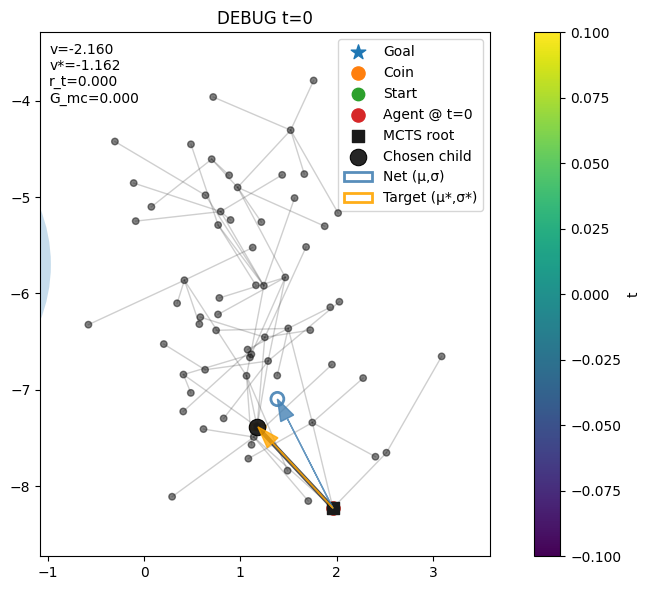

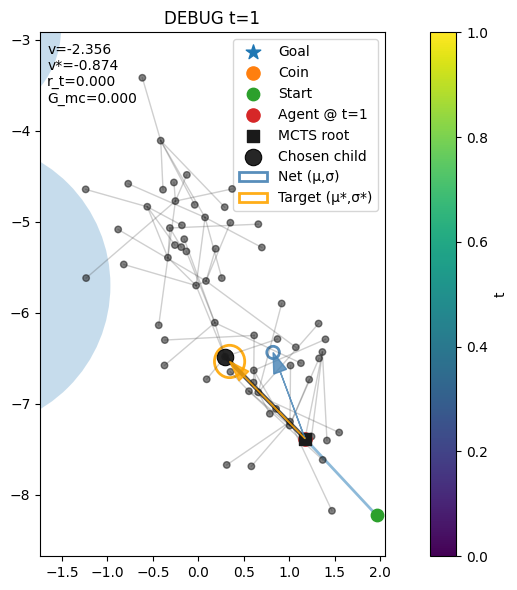

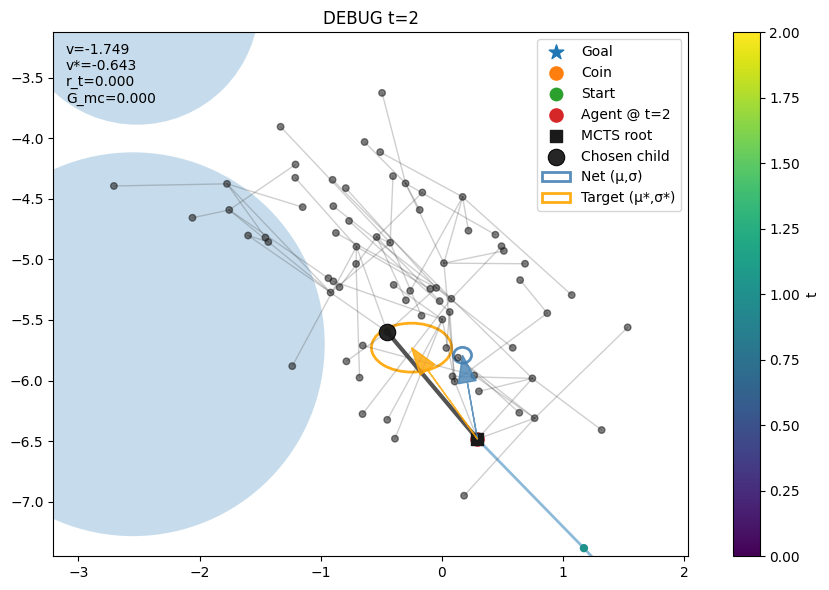

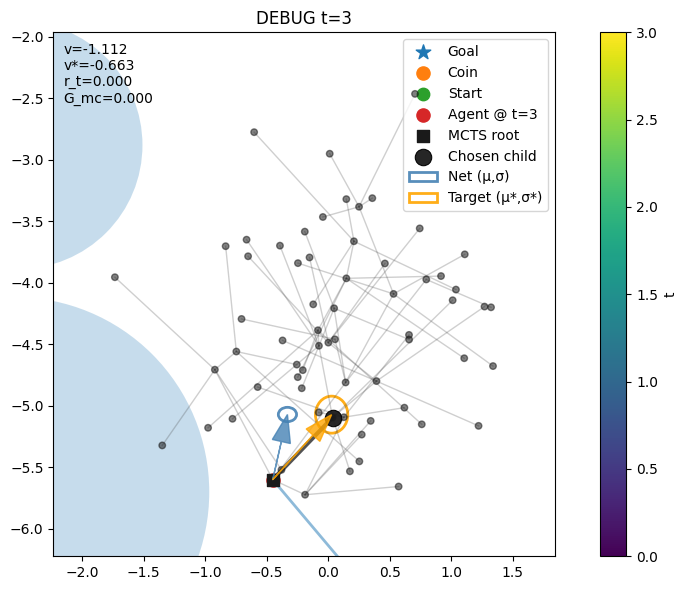

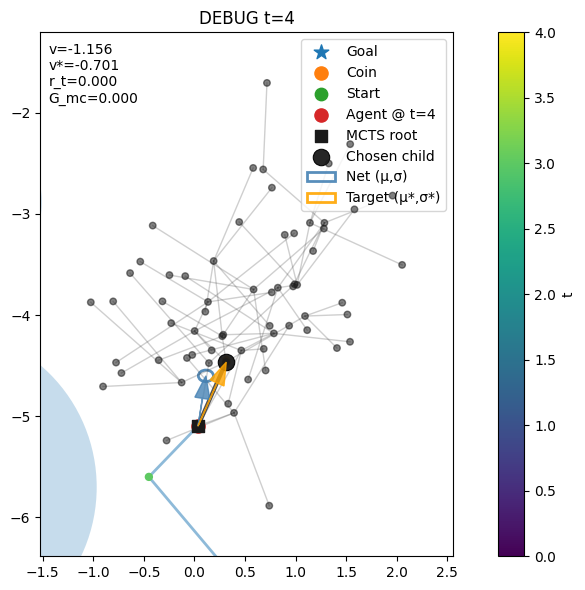

...

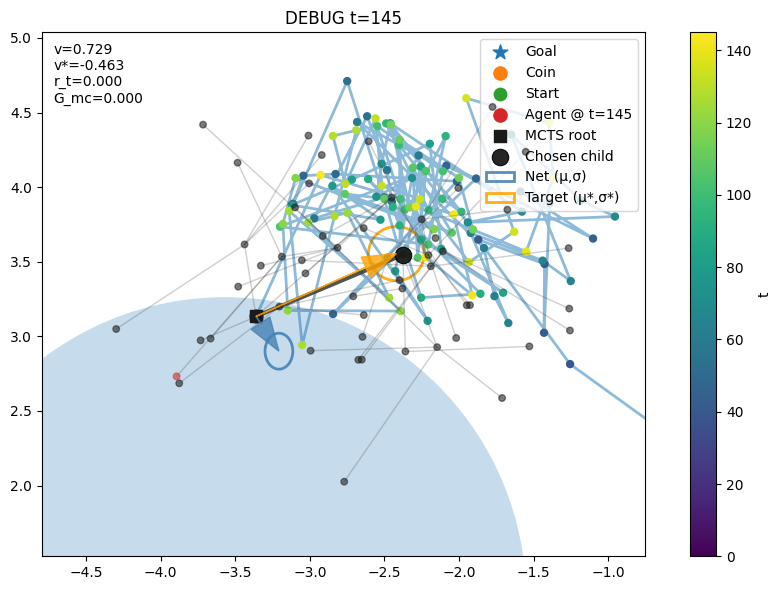

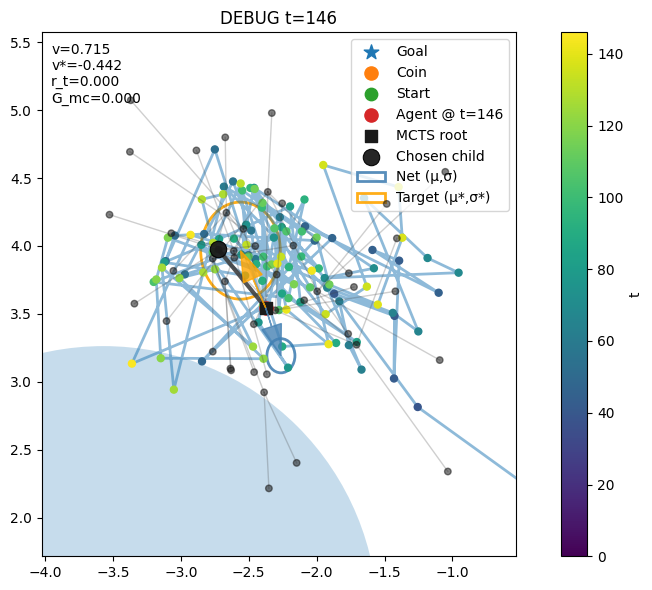

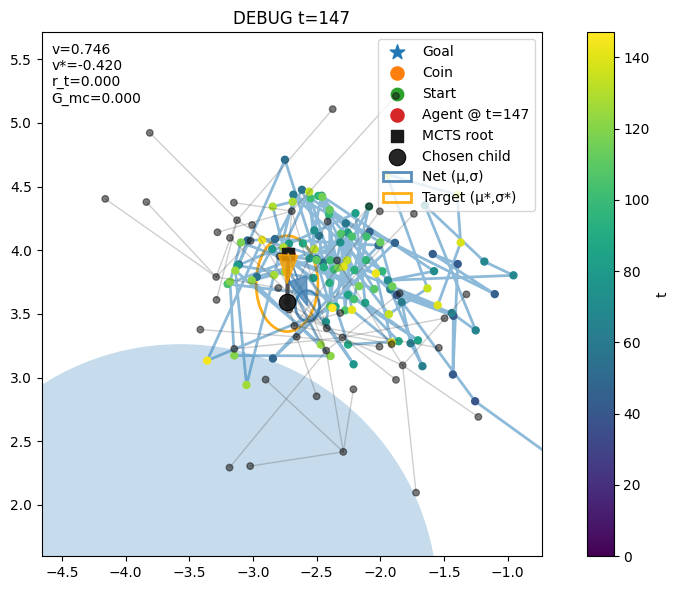

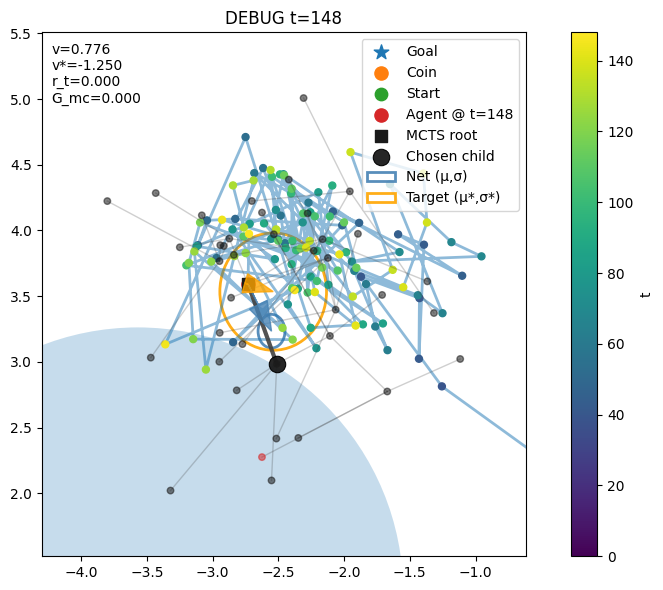

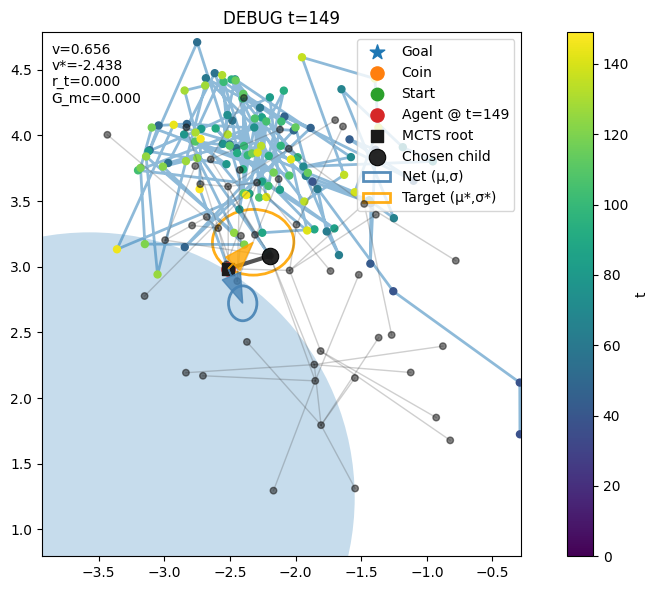

In [4]:
n = len(tr["roots"])

for i in range(n):
    fig, ax = plt.subplots(1, 1, figsize=(12, 6), sharex=True, sharey=True)
    plot_dbg_step(tr, i, ax=ax, max_depth=99, top_k_per_node=4, title=f"DEBUG t={i}", num_obstacles=NUM_OBSTACLES)
    plt.tight_layout()
    plt.show()